# London Address Data Analysis (2011-2024)

## Overview
This notebook aggregates London residential address data from 2011 to 2024, examining address count changes at both Output Area (OA) and  Ward  levels. The analysis includes:

- **Spatial Analysis**: Linking address points to Output Areas and Wards using geometric spatial joins
- **Temporal Analysis**: Year-over-year percentage changes in address counts across the study period
- **Interactive Visualisations**: Plotly charts with dropdown selections for exploring trends across different areas
- **Statistical Analysis**: statistics on address count changes, volatility, and consistency measures

## Data Sources
- **Address Data**: AddressBase Premium residential addresses (2011-2024) 
- **Boundaries**: Output Areas (2021) and Ward boundaries (2024) - Office for National Statistics
- **Lookup Tables**: Output Area to Ward mapping and London Output Area Classification (LOAC)

## Methodology
The analysis employs spatial-temporal methods including:
- Coordinate reference system alignment and transformation
- Spatial joins using geometric containment relationships
- Multi-level geographic aggregation from Output Areas to Wards
- Proper calculation of percentage changes across temporal boundaries
- Quality assurance through comprehensive validation procedures

---

In [ ]:
# Import essential libraries for spatial analysis, data processing, and visualisation
import os
import pandas as pd
import numpy as np
import zipfile
import geopandas as gpd
import time
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import psutil

# 1. Data Loading and Preparation

This section loads all required datasets for the analysis:
- **Address Data**: AddressBase Premium residential addresses (2011-2024)
- **Output Area Boundaries**: Output Areas 2021 for England and Wales
- **London Area Lookup**: LOAC lookup table to identify London Output Areas
- **Ward Boundaries**: Ward lookup table for administrative boundary mapping

## 1.1 Address Data Structure Overview

First, let's examine the structure of the address data to understand what we're working with.

In [3]:
# Show all files organised by year
zip_path = '/Users/user1/Documents/AdressBasePremium_residential_address_gis_2011-2024.zip'

with zipfile.ZipFile(zip_path) as z:
    files = z.namelist()
    
    print("ADDRESS DATA BY YEAR")
    print("=" * 40)
    
    # Group shapefiles by year
    shapefiles = [f for f in files if f.endswith('.shp')]
    years = {}
    
    for shp in shapefiles:
        # Extract year from filename
        if '2011' in shp or '2012' in shp or '2013' in shp or '2014' in shp or '2015' in shp or \
           '2016' in shp or '2017' in shp or '2018' in shp or '2019' in shp or '2020' in shp or \
           '2021' in shp or '2022' in shp or '2023' in shp or '2024' in shp:
            year = None
            for y in range(2011, 2025):
                if str(y) in shp:
                    year = str(y)
                    break
            if year:
                if year not in years:
                    years[year] = []
                years[year].append(shp)
    
    # Display organised by year
    for year in sorted(years.keys()):
        print(f"\nYear {year}:")
        for shp in years[year]:
            # Extract date from filename
            date_part = shp.split('_')[-1].replace('.shp', '')
            print(f"   {shp}")
            print(f"      Date: {date_part}")
            
            # Show file size
            file_info = z.getinfo(shp)
            file_size = file_info.file_size / (1024 * 1024)  # Convert to MB
            print(f"      Size: {file_size:.1f} MB")
    
    print(f"\nSUMMARY:")
    print(f"   • Total years: {len(years)}")
    print(f"   • Total shapefiles: {len(shapefiles)}")
    print(f"   • File types per shapefile: .shp, .shx, .dbf, .prj, .cpg (5 files each)")
    print(f"   • Total files in zip: {len(files)}")
    
    # Show all file names for reference
    print(f"\nALL SHAPEFILE NAMES:")
    for shp in sorted(shapefiles):
        print(f"   {shp}")

ADDRESS DATA BY YEAR

Year 2011:
   AdressBasePremium_residential_address_2011-06-30.shp
      Date: 2011-06-30
      Size: 94.1 MB

Year 2012:
   AdressBasePremium_residential_address_2012-06-30.shp
      Date: 2012-06-30
      Size: 94.6 MB

Year 2013:
   AdressBasePremium_residential_address_2013-06-30.shp
      Date: 2013-06-30
      Size: 95.5 MB

Year 2014:
   AdressBasePremium_residential_address_2014-06-30.shp
      Date: 2014-06-30
      Size: 96.6 MB

Year 2015:
   AdressBasePremium_residential_address_2015-06-30.shp
      Date: 2015-06-30
      Size: 97.7 MB

Year 2016:
   AdressBasePremium_residential_address_2016-06-30.shp
      Date: 2016-06-30
      Size: 99.0 MB

Year 2017:
   AdressBasePremium_residential_address_2017-06-30.shp
      Date: 2017-06-30
      Size: 100.1 MB

Year 2018:
   AdressBasePremium_residential_address_2018-06-30.shp
      Date: 2018-06-30
      Size: 101.2 MB

Year 2019:
   AdressBasePremium_residential_address_2019-06-30.shp
      Date: 2019-06-3

In [4]:
# 1.2 Load Sample Address Data for Structure Analysis
# Load the first shapefile as a GeoPandas DataFrame to understand the data structure

zip_path = '/Users/user1/Documents/AdressBasePremium_residential_address_gis_2011-2024.zip'

with zipfile.ZipFile(zip_path) as z:
    # Get all shapefile names
    shp_files = [f for f in z.namelist() if f.endswith('.shp')]
    
    if shp_files:
        # Sort to get the first one chronologically
        first_shp = sorted(shp_files)[0]
        print(f"Loading shapefile: {first_shp}")
        
        # Load the shapefile as a GeoPandas DataFrame
        gdf = gpd.read_file(f"zip://{zip_path}!{first_shp}")
        
        print(f"\nDATAFRAME INFO:")
        print(f"   • Shape: {gdf.shape[0]:,} rows × {gdf.shape[1]} columns")
        print(f"   • CRS: {gdf.crs}")
        print(f"   • Geometry type: {gdf.geometry.geom_type.iloc[0] if not gdf.empty else 'Unknown'}")
        print(f"   • Memory usage: {gdf.memory_usage(deep=True).sum() / 1024**2:.1f} MB")
        
        print(f"\nCOLUMN INFORMATION:")
        for col in gdf.columns:
            if col != 'geometry':
                dtype = gdf[col].dtype
                null_count = gdf[col].isnull().sum()
                print(f"   • {col}: {dtype} ({null_count:,} nulls)")
        
        print(f"\nFIRST 5 ROWS:")
        display(gdf.head())
        
        print(f"\nBASIC STATISTICS:")
        if 'borough' in gdf.columns:
            print(f"   • Unique boroughs: {gdf['borough'].nunique()}")
            print(f"   • Borough counts:")
            borough_counts = gdf['borough'].value_counts().head()
            for borough, count in borough_counts.items():
                print(f"     - {borough}: {count:,}")
        
        # Store the dataframe for later use
        residential_address_gdf = gdf
        print(f"\n✅ DataFrame stored as 'residential_address_gdf'")
        
    else:
        print("❌ No shapefiles found in the zip file")

Loading shapefile: AdressBasePremium_residential_address_2011-06-30.shp

DATAFRAME INFO:
   • Shape: 3,523,558 rows × 5 columns
   • CRS: EPSG:27700
   • Geometry type: Point
   • Memory usage: 304.0 MB

COLUMN INFORMATION:
   • uprn: int64 (0 nulls)
   • x_coordina: float64 (0 nulls)
   • y_coordina: float64 (0 nulls)
   • borough: object (0 nulls)

FIRST 5 ROWS:


,uprn,x_coordina,y_coordina,borough,geometry
0,100020574439,529733.0,160479.0,Croydon,POINT (529733 160479)
1,100020574442,529727.0,160525.0,Croydon,POINT (529727 160525)
2,100020574443,529731.0,160548.0,Croydon,POINT (529731 160548)
3,100020574444,529730.0,160568.0,Croydon,POINT (529730 160568)
4,100020574445,529730.0,160555.0,Croydon,POINT (529730 160555)



BASIC STATISTICS:
   • Unique boroughs: 33
   • Borough counts:
     - Croydon: 147,989
     - Barnet: 146,110
     - Wandsworth: 139,861
     - Lambeth: 138,040
     - Bromley: 137,429

✅ DataFrame stored as 'residential_address_gdf'


In [5]:
# Display sample residential address data
residential_address_gdf

,uprn,x_coordina,y_coordina,borough,geometry
0,100020574439,529733.0,160479.0,Croydon,POINT (529733 160479)
1,100020574442,529727.0,160525.0,Croydon,POINT (529727 160525)
2,100020574443,529731.0,160548.0,Croydon,POINT (529731 160548)
3,100020574444,529730.0,160568.0,Croydon,POINT (529730 160568)
4,100020574445,529730.0,160555.0,Croydon,POINT (529730 160555)
...,...,...,...,...,...
3523553,202202475,518281.0,186178.0,Brent,POINT (518281 186178)
3523554,202202476,518281.0,186178.0,Brent,POINT (518281 186178)
3523555,202202477,518281.0,186178.0,Brent,POINT (518281 186178)
3523556,202202478,518231.0,186116.0,Brent,POINT (518231 186116)


## 1.3 Load Output Area Boundaries

Loading the Output Area boundaries for 2021 to provide the geographic framework for our analysis.

In [6]:
# Read Output Area shapefile as a GeoDataFrame
oa_zip_path = '/Users/user1/Downloads/Output_Areas_2021_EW_BFE_V9_-4280877107876255952.zip'

# Find the .shp file inside the zip
with zipfile.ZipFile(oa_zip_path) as oa_zip:
    oa_shp_files = [f for f in oa_zip.namelist() if f.endswith('.shp')]
    if oa_shp_files:
        oa_shp = oa_shp_files[0]
        print(f"Output Area shapefile: {oa_shp}")
        output_area_gdf = gpd.read_file(f"zip://{oa_zip_path}!{oa_shp}")
        
        print(f"\nOUTPUT AREA DATA INFO:")
        print(f"   • Shape: {output_area_gdf.shape[0]:,} rows × {output_area_gdf.shape[1]} columns")
        print(f"   • CRS: {output_area_gdf.crs}")
        print(f"   • Memory usage: {output_area_gdf.memory_usage(deep=True).sum() / 1024**2:.1f} MB")
        
        print(f"\nCOLUMN INFORMATION:")
        for col in output_area_gdf.columns:
            if col != 'geometry':
                dtype = output_area_gdf[col].dtype
                null_count = output_area_gdf[col].isnull().sum()
                print(f"   • {col}: {dtype} ({null_count:,} nulls)")
        
        print(f"\n✅ Output Area data loaded successfully")
    else:
        print("❌ No shapefile found in the Output Area zip.")

Output Area shapefile: OA_2021_EW_BFE_V9.shp

OUTPUT AREA DATA INFO:
   • Shape: 188,880 rows × 10 columns
   • CRS: EPSG:27700
   • Memory usage: 59.8 MB

COLUMN INFORMATION:
   • OA21CD: object (0 nulls)
   • LSOA21CD: object (0 nulls)
   • LSOA21NM: object (0 nulls)
   • LSOA21NMW: object (178,605 nulls)
   • BNG_E: int64 (0 nulls)
   • BNG_N: int64 (0 nulls)
   • LAT: float64 (0 nulls)
   • LONG: float64 (0 nulls)
   • GlobalID: object (0 nulls)

✅ Output Area data loaded successfully


In [7]:
# Load the LOAC lookup CSV file for London Output Areas 2021
loac_lookup_path = '/Users/user1/Downloads/LOAC_lookup.csv'
loac_lookup_df = pd.read_csv(loac_lookup_path)

In [8]:
loac21 =loac_lookup_df['OA'].unique()
# output_area_gdf filter
london_output_area_gdf = output_area_gdf[output_area_gdf['OA21CD'].isin(loac21)]

In [9]:
# Verify Coordinate Reference Systems
print(" COORDINATE REFERENCE SYSTEMS:")
print(f"   • Address data CRS: {residential_address_gdf.crs}")
print(f"   • London Output Areas CRS: {london_output_area_gdf.crs}")

# Check if they match
if residential_address_gdf.crs == london_output_area_gdf.crs:
    print("✅ CRS match - no transformation needed")
else:
    print("⚠️  CRS mismatch - transformation will be required for spatial join")

 COORDINATE REFERENCE SYSTEMS:
   • Address data CRS: EPSG:27700
   • London Output Areas CRS: EPSG:27700
✅ CRS match - no transformation needed


<Axes: >

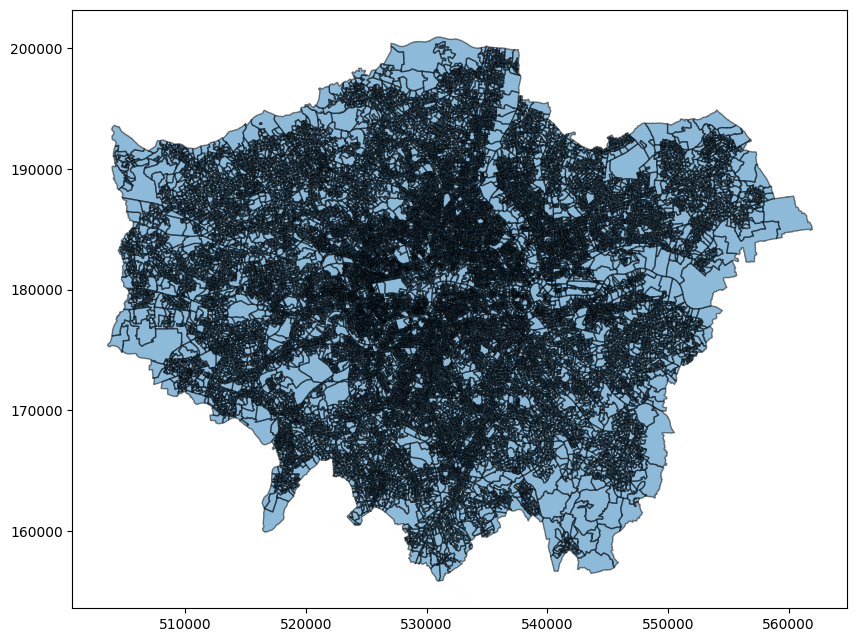

In [10]:
#map output_area_gdf
london_output_area_gdf.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')

# 3. Spatial Analysis: Single Year Processing

## 3.1 Spatial Join: Address Points to Output Areas

Performing spatial join to count residential addresses within each Output Area. This is the core spatial analysis that links address points to geographic boundaries.

In [11]:
# Spatial join: Count residential addresses within each Output Area
print("🔄 Performing spatial join...")
print(f"   • Address data CRS: {residential_address_gdf.crs}")
print(f"   • London Output Area CRS: {london_output_area_gdf.crs}")

# Check if CRS match, if not, transform to match
if residential_address_gdf.crs != london_output_area_gdf.crs:
    print("⚠️  CRS mismatch detected. Transforming address data to match Output Areas...")
    residential_address_gdf_transformed = residential_address_gdf.to_crs(london_output_area_gdf.crs)
else:
    residential_address_gdf_transformed = residential_address_gdf.copy()

print(f"✅ Both datasets now in CRS: {london_output_area_gdf.crs}")

# Perform spatial join - this will assign each address point to its containing Output Area
print("\n🔄 Executing spatial join (this may take a few minutes for large datasets)...")
start_time = time.time()

# Use sjoin to find which Output Area each address point falls within
address_with_oa = gpd.sjoin(
    residential_address_gdf_transformed, 
    london_output_area_gdf, 
    how='left',  # Keep all address points, even if they don't fall in an OA
    predicate='within'  # Address point must be within the OA polygon
)

elapsed_time = time.time() - start_time
print(f"✅ Spatial join completed in {elapsed_time:.1f} seconds")

print(f"\ SPATIAL JOIN RESULTS:")
print(f"   • Original addresses: {len(residential_address_gdf):,}")
print(f"   • Addresses with OA match: {len(address_with_oa.dropna(subset=['index_right'])):,}")
print(f"   • Addresses without OA match: {len(address_with_oa[address_with_oa['index_right'].isna()]):,}")

# Count addresses per Output Area and preserve borough information
print("\n Counting addresses per Output Area...")
oa_address_counts = address_with_oa.groupby('index_right').agg({
    'uprn': 'count',  # Count addresses
    'borough': 'first'  # Take the first borough name (they should all be the same within an OA)
}).reset_index()
oa_address_counts.rename(columns={'uprn': 'address_count'}, inplace=True)

# Also get unique boroughs per OA (in case an OA spans multiple boroughs)
oa_borough_info = address_with_oa.groupby('index_right')['borough'].apply(
    lambda x: ', '.join(sorted(x.unique()))
).reset_index()
oa_borough_info.rename(columns={'borough': 'borough_list'}, inplace=True)

# Merge borough information with counts
oa_address_counts = oa_address_counts.merge(oa_borough_info, on='index_right', how='left')

# Merge the counts back to the Output Area geometries
output_area_with_counts = london_output_area_gdf.merge(
    oa_address_counts, 
    left_index=True, 
    right_on='index_right', 
    how='left'
)

# Fill NaN values with 0 (Output Areas with no addresses)
output_area_with_counts['address_count'] = output_area_with_counts['address_count'].fillna(0)
output_area_with_counts['borough'] = output_area_with_counts['borough'].fillna('No addresses')
output_area_with_counts['borough_list'] = output_area_with_counts['borough_list'].fillna('No addresses')

print(f"\n SUMMARY STATISTICS:")
print(f"   • Total Output Areas: {len(output_area_with_counts):,}")
print(f"   • OAs with addresses: {(output_area_with_counts['address_count'] > 0).sum():,}")
print(f"   • OAs with no addresses: {(output_area_with_counts['address_count'] == 0).sum():,}")
print(f"   • Mean addresses per OA: {output_area_with_counts['address_count'].mean():.1f}")
print(f"   • Median addresses per OA: {output_area_with_counts['address_count'].median():.1f}")
print(f"   • Max addresses in single OA: {output_area_with_counts['address_count'].max():,}")

# Show top 10 Output Areas by address count
print(f"\n TOP 10 OUTPUT AREAS BY ADDRESS COUNT:")
top_oas = output_area_with_counts.nlargest(10, 'address_count')
for idx, row in top_oas.iterrows():
    oa_code = row.get('OA21CD', f'Index_{idx}')  # Use OA code if available, otherwise index
    borough_name = row.get('borough', 'Unknown')
    print(f"   {oa_code} ({borough_name}): {row['address_count']:,} addresses")

# Store the result
print(f"\n✅ Result stored as 'output_area_with_counts'")
print(f"   Columns: {list(output_area_with_counts.columns)}")

# Display first few rows
display(output_area_with_counts.head())

<>:30: SyntaxWarning: invalid escape sequence '\ '
<>:30: SyntaxWarning: invalid escape sequence '\ '
/var/folders/k7/sydv9mbx0kz7fx7373rx_2100000gp/T/ipykernel_77060/522322335.py:30: SyntaxWarning: invalid escape sequence '\ '
  print(f"\ SPATIAL JOIN RESULTS:")


🔄 Performing spatial join...
   • Address data CRS: EPSG:27700
   • London Output Area CRS: EPSG:27700
✅ Both datasets now in CRS: EPSG:27700

🔄 Executing spatial join (this may take a few minutes for large datasets)...
✅ Spatial join completed in 5.0 seconds
\ SPATIAL JOIN RESULTS:
   • Original addresses: 3,523,558
   • Addresses with OA match: 3,523,486
   • Addresses without OA match: 72

 Counting addresses per Output Area...

 SUMMARY STATISTICS:
   • Total Output Areas: 26,369
   • OAs with addresses: 25,908
   • OAs with no addresses: 461
   • Mean addresses per OA: 133.6
   • Median addresses per OA: 132.0
   • Max addresses in single OA: 1,099.0

 TOP 10 OUTPUT AREAS BY ADDRESS COUNT:
   E00183729 (Tower Hamlets): 1,099.0 addresses
   E00013488 (Islington): 1,002.0 addresses
   E00174877 (Kingston upon Thames): 839.0 addresses
   E00190356 (Camden): 821.0 addresses
   E00179062 (Brent): 775.0 addresses
   E00184383 (Kingston upon Thames): 713.0 addresses
   E00004526 (Camden)

,OA21CD,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,GlobalID,geometry,index_right,address_count,borough,borough_list
0.0,E00000001,E01000001,City of London 001A,None,532250,181864,51.5202,-0.09523,c981dc33-fe6f-4d55-a084-d12e5d0221e2,"POLYGON ((532303.125 181877.594, 532301.345 18...",0.0,116.0,City of London,City of London
1.0,E00000003,E01000001,City of London 001A,None,532171,181819,51.5198,-0.09638,d13e6e18-bd34-4b31-8807-da0eab800e0f,"POLYGON ((532198.818 181863.087, 532192.305 18...",1.0,125.0,City of London,City of London
2.0,E00000005,E01000001,City of London 001A,None,532166,181722,51.5190,-0.09649,1695f2eb-ec12-484d-bfb1-89308bd386be,"POLYGON ((532178.979 181764.041, 532180.131 18...",2.0,76.0,City of London,City of London
3.0,E00000007,E01000001,City of London 001A,None,532088,181473,51.5167,-0.09771,98128f38-f049-4a66-a3a9-b10189281aa9,"POLYGON ((532160 181671, 532174 181666, 532183...",3.0,106.0,City of London,City of London
4.0,E00000010,E01000003,City of London 001C,None,532092,182114,51.5225,-0.09741,c84ff0e9-3132-424c-8e27-cb038f7eee59,"POLYGON ((532127.958 182133.192, 532106.413 18...",4.0,146.0,City of London,City of London


## 3.2 Address Distribution Analysis

Analysing the distribution of addresses across Output Areas and boroughs.

In [12]:
## 3.2 Address Distribution Analysis
#Analysing the distribution of addresses across Output Areas and boroughs.print("🏢 BOROUGH INFORMATION VERIFICATION")

print("=" * 50)

# Show columns in final dataset
print(f"Final dataset columns:")
for col in output_area_with_counts.columns:
    print(f"   • {col}")

print(f"\n BOROUGH SUMMARY:")
borough_summary = output_area_with_counts[output_area_with_counts['address_count'] > 0].groupby('borough').agg({
    'address_count': ['count', 'sum', 'mean', 'min', 'max']
}).round(1)

borough_summary.columns = ['OAs_with_addresses', 'Total_addresses', 'Mean_per_OA', 'Min_per_OA', 'Max_per_OA']
borough_summary = borough_summary.sort_values('Total_addresses', ascending=False)

print(f"Top 10 boroughs by total addresses:")
for borough, row in borough_summary.head(10).iterrows():
    print(f"   {borough}: {row['Total_addresses']:,.0f} addresses in {row['OAs_with_addresses']:,.0f} OAs")
    print(f"       Per OA: Min={row['Min_per_OA']:.0f}, Mean={row['Mean_per_OA']:.1f}, Max={row['Max_per_OA']:.0f}")

print(f"\n OVERALL OUTPUT AREA STATISTICS:")
oas_with_addresses = output_area_with_counts[output_area_with_counts['address_count'] > 0]['address_count']
print(f"   • Total OAs with addresses: {len(oas_with_addresses):,}")
print(f"   • Min addresses per OA: {oas_with_addresses.min():.0f}")
print(f"   • Mean addresses per OA: {oas_with_addresses.mean():.1f}")
print(f"   • Median addresses per OA: {oas_with_addresses.median():.1f}")
print(f"   • Max addresses per OA: {oas_with_addresses.max():.0f}")
print(f"   • Standard deviation: {oas_with_addresses.std():.1f}")

# Show distribution percentiles
percentiles = [10, 25, 75, 90, 95, 99]
print(f"\nADDRESS COUNT PERCENTILES (OAs with addresses only):")
for p in percentiles:
    value = oas_with_addresses.quantile(p/100)
    print(f"   • {p}th percentile: {value:.0f} addresses")

print(f"\n Sample of Output Areas with borough names:")
sample_data = output_area_with_counts[output_area_with_counts['address_count'] > 100].head()
for idx, row in sample_data.iterrows():
    print(f"   OA {row['OA21CD']} in {row['borough']}: {row['address_count']:.0f} addresses")

# Check for any cases where an OA spans multiple boroughs
multi_borough_oas = output_area_with_counts[
    (output_area_with_counts['borough_list'].str.contains(',', na=False)) & 
    (output_area_with_counts['address_count'] > 0)
]

if len(multi_borough_oas) > 0:
    print(f"\n⚠️  Found {len(multi_borough_oas)} Output Areas that span multiple boroughs:")
    for idx, row in multi_borough_oas.head().iterrows():
        print(f"   OA {row['OA21CD']}: {row['borough_list']}")
else:
    print(f"\n✅ All Output Areas belong to a single borough")

Final dataset columns:
   • OA21CD
   • LSOA21CD
   • LSOA21NM
   • LSOA21NMW
   • BNG_E
   • BNG_N
   • LAT
   • LONG
   • GlobalID
   • geometry
   • index_right
   • address_count
   • borough
   • borough_list

 BOROUGH SUMMARY:
Top 10 boroughs by total addresses:
   Croydon: 147,987 addresses in 1,160 OAs
       Per OA: Min=1, Mean=127.6, Max=236
   Barnet: 146,107 addresses in 1,093 OAs
       Per OA: Min=1, Mean=133.7, Max=504
   Wandsworth: 139,863 addresses in 1,009 OAs
       Per OA: Min=8, Mean=138.6, Max=581
   Lambeth: 138,028 addresses in 993 OAs
       Per OA: Min=2, Mean=139.0, Max=378
   Bromley: 137,428 addresses in 1,035 OAs
       Per OA: Min=1, Mean=132.8, Max=265
   Southwark: 134,208 addresses in 943 OAs
       Per OA: Min=1, Mean=142.3, Max=466
   Westminster: 131,981 addresses in 776 OAs
       Per OA: Min=1, Mean=170.1, Max=536
   Ealing: 130,054 addresses in 1,001 OAs
       Per OA: Min=1, Mean=129.9, Max=331
   Enfield: 129,299 addresses in 922 OAs
       Pe

## 3.3 Unmatched Addresses Analysis

Investigating addresses that could not be matched to any Output Area.

In [13]:
# Examine the 72 addresses that couldn't be matched to an Output Area
print(" UNMATCHED ADDRESSES ANALYSIS")
print("=" * 50)

# Get the addresses that couldn't be matched
unmatched_addresses = address_with_oa[address_with_oa['index_right'].isna()]

print(f" UNMATCHED ADDRESSES SUMMARY:")
print(f"   • Total unmatched addresses: {len(unmatched_addresses):,}")
print(f"   • Percentage of total: {(len(unmatched_addresses) / len(residential_address_gdf) * 100):.4f}%")

if len(unmatched_addresses) > 0:
    print(f"\n UNMATCHED ADDRESSES DETAILS:")
    print(f"   Columns available: {list(unmatched_addresses.columns)}")
    
    print(f"\n UNMATCHED ADDRESSES BY BOROUGH:")
    borough_counts = unmatched_addresses['borough'].value_counts()
    for borough, count in borough_counts.items():
        print(f"   • {borough}: {count} addresses")
    
    print(f"\n COORDINATE RANGES OF UNMATCHED ADDRESSES:")
    print(f"   • X coordinates: {unmatched_addresses['x_coordina'].min():.0f} to {unmatched_addresses['x_coordina'].max():.0f}")
    print(f"   • Y coordinates: {unmatched_addresses['y_coordina'].min():.0f} to {unmatched_addresses['y_coordina'].max():.0f}")
    
    print(f"\n🔍 FIRST 20 UNMATCHED ADDRESSES:")
    columns_to_show = ['uprn', 'x_coordina', 'y_coordina', 'borough']
    display(unmatched_addresses[columns_to_show].head(20))
    
    print(f"\nSTATISTICAL ANALYSIS OF UNMATCHED ADDRESSES:")
    print(f"   • Unique boroughs: {unmatched_addresses['borough'].nunique()}")
    print(f"   • Unique UPRNs: {unmatched_addresses['uprn'].nunique()}")
    
    # Check if coordinates are within expected ranges for UK
    print(f"\n COORDINATE VALIDATION:")
    # British National Grid typical ranges: X: 0-700000, Y: 0-1300000
    x_min, x_max = 0, 700000
    y_min, y_max = 0, 1300000
    
    x_out_of_range = unmatched_addresses[
        (unmatched_addresses['x_coordina'] < x_min) | 
        (unmatched_addresses['x_coordina'] > x_max)
    ]
    y_out_of_range = unmatched_addresses[
        (unmatched_addresses['y_coordina'] < y_min) | 
        (unmatched_addresses['y_coordina'] > y_max)
    ]
    
    print(f"   • Addresses with X coordinates outside typical UK range ({x_min}-{x_max}): {len(x_out_of_range)}")
    print(f"   • Addresses with Y coordinates outside typical UK range ({y_min}-{y_max}): {len(y_out_of_range)}")
    
    if len(x_out_of_range) > 0:
        print(f"\n❌ X COORDINATES OUT OF RANGE:")
        for idx, row in x_out_of_range.head(10).iterrows():
            print(f"   UPRN {row['uprn']}: X={row['x_coordina']}, Y={row['y_coordina']} ({row['borough']})")
    
    if len(y_out_of_range) > 0:
        print(f"\n❌ Y COORDINATES OUT OF RANGE:")
        for idx, row in y_out_of_range.head(10).iterrows():
            print(f"   UPRN {row['uprn']}: X={row['x_coordina']}, Y={row['y_coordina']} ({row['borough']})")
    
    # Check for potential coordinate issues
    zero_coords = unmatched_addresses[
        (unmatched_addresses['x_coordina'] == 0) | 
        (unmatched_addresses['y_coordina'] == 0)
    ]
    
    if len(zero_coords) > 0:
        print(f"\n⚠️  ADDRESSES WITH ZERO COORDINATES:")
        print(f"   • Count: {len(zero_coords)}")
        for idx, row in zero_coords.head(5).iterrows():
            print(f"   UPRN {row['uprn']}: X={row['x_coordina']}, Y={row['y_coordina']} ({row['borough']})")
    
    # Show all unmatched addresses if the list is small
    if len(unmatched_addresses) <= 100:
        print(f"\n COMPLETE LIST OF ALL {len(unmatched_addresses)} UNMATCHED ADDRESSES:")
        for idx, row in unmatched_addresses.iterrows():
            print(f"   UPRN {row['uprn']}: {row['borough']}, X={row['x_coordina']:.0f}, Y={row['y_coordina']:.0f}")

else:
    print("✅ All addresses were successfully matched to Output Areas!")

 UNMATCHED ADDRESSES ANALYSIS
 UNMATCHED ADDRESSES SUMMARY:
   • Total unmatched addresses: 72
   • Percentage of total: 0.0020%

 UNMATCHED ADDRESSES DETAILS:
   Columns available: ['uprn', 'x_coordina', 'y_coordina', 'borough', 'geometry', 'index_right', 'OA21CD', 'LSOA21CD', 'LSOA21NM', 'LSOA21NMW', 'BNG_E', 'BNG_N', 'LAT', 'LONG', 'GlobalID']

 UNMATCHED ADDRESSES BY BOROUGH:
   • Hounslow: 27 addresses
   • Waltham Forest: 16 addresses
   • Hackney: 11 addresses
   • Lewisham: 4 addresses
   • Barking and Dagenham: 4 addresses
   • Southwark: 3 addresses
   • Enfield: 2 addresses
   • Bromley: 1 addresses
   • Brent: 1 addresses
   • Richmond upon Thames: 1 addresses
   • Havering: 1 addresses
   • Barnet: 1 addresses

 COORDINATE RANGES OF UNMATCHED ADDRESSES:
   • X coordinates: 510804 to 549146
   • Y coordinates: 171001 to 194424

🔍 FIRST 20 UNMATCHED ADDRESSES:


,uprn,x_coordina,y_coordina,borough
170614,10008308782,533267.0,184694.0,Hackney
171007,10008309140,534118.0,184053.0,Hackney
202122,10008308587,533580.0,185929.0,Hackney
202123,10008308592,533580.0,185929.0,Hackney
202124,10008308593,533580.0,185929.0,Hackney
202125,10008308597,533580.0,185929.0,Hackney
210165,10008308667,532545.0,185756.0,Hackney
228401,10008308744,534829.0,185891.0,Hackney
229081,10008309268,533683.0,187974.0,Hackney
229669,10008309691,534240.0,185232.0,Hackney



STATISTICAL ANALYSIS OF UNMATCHED ADDRESSES:
   • Unique boroughs: 12
   • Unique UPRNs: 72

 COORDINATE VALIDATION:
   • Addresses with X coordinates outside typical UK range (0-700000): 0
   • Addresses with Y coordinates outside typical UK range (0-1300000): 0

 COMPLETE LIST OF ALL 72 UNMATCHED ADDRESSES:
   UPRN 10008308782: Hackney, X=533267, Y=184694
   UPRN 10008309140: Hackney, X=534118, Y=184053
   UPRN 10008308587: Hackney, X=533580, Y=185929
   UPRN 10008308592: Hackney, X=533580, Y=185929
   UPRN 10008308593: Hackney, X=533580, Y=185929
   UPRN 10008308597: Hackney, X=533580, Y=185929
   UPRN 10008308667: Hackney, X=532545, Y=185756
   UPRN 10008308744: Hackney, X=534829, Y=185891
   UPRN 10008309268: Hackney, X=533683, Y=187974
   UPRN 10008309691: Hackney, X=534240, Y=185232
   UPRN 200000556145: Lewisham, X=535380, Y=172582
   UPRN 100021969099: Lewisham, X=538359, Y=174925
   UPRN 100021969100: Lewisham, X=538359, Y=174925
   UPRN 100021588180: Hounslow, X=521217, Y=1

In [14]:
output_area_with_counts

,OA21CD,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,GlobalID,geometry,index_right,address_count,borough,borough_list
0.0,E00000001,E01000001,City of London 001A,None,532250,181864,51.5202,-0.09523,c981dc33-fe6f-4d55-a084-d12e5d0221e2,"POLYGON ((532303.125 181877.594, 532301.345 18...",0.0,116.0,City of London,City of London
1.0,E00000003,E01000001,City of London 001A,None,532171,181819,51.5198,-0.09638,d13e6e18-bd34-4b31-8807-da0eab800e0f,"POLYGON ((532198.818 181863.087, 532192.305 18...",1.0,125.0,City of London,City of London
2.0,E00000005,E01000001,City of London 001A,None,532166,181722,51.5190,-0.09649,1695f2eb-ec12-484d-bfb1-89308bd386be,"POLYGON ((532178.979 181764.041, 532180.131 18...",2.0,76.0,City of London,City of London
3.0,E00000007,E01000001,City of London 001A,None,532088,181473,51.5167,-0.09771,98128f38-f049-4a66-a3a9-b10189281aa9,"POLYGON ((532160 181671, 532174 181666, 532183...",3.0,106.0,City of London,City of London
4.0,E00000010,E01000003,City of London 001C,None,532092,182114,51.5225,-0.09741,c84ff0e9-3132-424c-8e27-cb038f7eee59,"POLYGON ((532127.958 182133.192, 532106.413 18...",4.0,146.0,City of London,City of London
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25903.0,E00190465,E01033593,Westminster 015F,None,526945,181526,51.5184,-0.17177,9346a6dc-b85d-43d5-ac86-74413870ef8d,"POLYGON ((527030.984 181530.533, 527013.382 18...",178475.0,288.0,Westminster,Westminster
25904.0,E00190466,E01002814,Kensington and Chelsea 015A,None,524816,178807,51.4944,-0.20340,6fa2e61b-f907-46a0-beb5-568ed71cb3b4,"POLYGON ((524878.91 178819.075, 524899.014 178...",178476.0,292.0,Kensington and Chelsea,Kensington and Chelsea
25905.0,E00190467,E01002814,Kensington and Chelsea 015A,None,524667,178949,51.4957,-0.20549,917c4683-d3f3-427d-91ee-b41e8e6224b9,"POLYGON ((524766.157 178957.37, 524771.153 178...",178477.0,1.0,Kensington and Chelsea,Kensington and Chelsea
25906.0,E00190468,E01002814,Kensington and Chelsea 015A,None,524779,179058,51.4967,-0.20384,a4c063bd-220f-42d1-a38c-505def5f34c1,"POLYGON ((524881.786 179152.711, 524880.407 17...",178478.0,166.0,Kensington and Chelsea,Kensington and Chelsea


# 4. Multi-Year Address Data Processing

## 4.1 Process All Years (2011-2024)

Now we'll process all years of address data and perform spatial joins with the London Output Areas.

In [15]:
london_output_area_gdf

,OA21CD,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,GlobalID,geometry
0,E00000001,E01000001,City of London 001A,None,532250,181864,51.5202,-0.09523,c981dc33-fe6f-4d55-a084-d12e5d0221e2,"POLYGON ((532303.125 181877.594, 532301.345 18..."
1,E00000003,E01000001,City of London 001A,None,532171,181819,51.5198,-0.09638,d13e6e18-bd34-4b31-8807-da0eab800e0f,"POLYGON ((532198.818 181863.087, 532192.305 18..."
2,E00000005,E01000001,City of London 001A,None,532166,181722,51.5190,-0.09649,1695f2eb-ec12-484d-bfb1-89308bd386be,"POLYGON ((532178.979 181764.041, 532180.131 18..."
3,E00000007,E01000001,City of London 001A,None,532088,181473,51.5167,-0.09771,98128f38-f049-4a66-a3a9-b10189281aa9,"POLYGON ((532160 181671, 532174 181666, 532183..."
4,E00000010,E01000003,City of London 001C,None,532092,182114,51.5225,-0.09741,c84ff0e9-3132-424c-8e27-cb038f7eee59,"POLYGON ((532127.958 182133.192, 532106.413 18..."
...,...,...,...,...,...,...,...,...,...,...
178475,E00190465,E01033593,Westminster 015F,None,526945,181526,51.5184,-0.17177,9346a6dc-b85d-43d5-ac86-74413870ef8d,"POLYGON ((527030.984 181530.533, 527013.382 18..."
178476,E00190466,E01002814,Kensington and Chelsea 015A,None,524816,178807,51.4944,-0.20340,6fa2e61b-f907-46a0-beb5-568ed71cb3b4,"POLYGON ((524878.91 178819.075, 524899.014 178..."
178477,E00190467,E01002814,Kensington and Chelsea 015A,None,524667,178949,51.4957,-0.20549,917c4683-d3f3-427d-91ee-b41e8e6224b9,"POLYGON ((524766.157 178957.37, 524771.153 178..."
178478,E00190468,E01002814,Kensington and Chelsea 015A,None,524779,179058,51.4967,-0.20384,a4c063bd-220f-42d1-a38c-505def5f34c1,"POLYGON ((524881.786 179152.711, 524880.407 17..."


In [16]:
shp_dir = '/Users/user1/Documents/recoding_adress_data_2011_2021/london_data/adress_data_shps_unzipped'
all_years_gdfs = []

# Collect all .shp file names (assumes flat directory structure)
shp_files = sorted([f for f in os.listdir(shp_dir) if f.endswith('.shp')])
print(f"Found {len(shp_files)} shapefiles to process in: {shp_dir}")

for i, shp_file in enumerate(shp_files, 1):
    print(f"\n[{i}/{len(shp_files)}] Processing: {shp_file}")

    # Extract year from filename
    year = None
    for y in range(2011, 2025):
        if str(y) in shp_file:
            year = str(y)
            break

    shp_path = os.path.join(shp_dir, shp_file)

    # Load and time
    start_time = time.time()
    gdf = gpd.read_file(shp_path)
    load_time = time.time() - start_time
    mem_mb = gdf.memory_usage(deep=True).sum() / 1024**2

    print(f"   Year: {year}")
    print(f"   Loaded {len(gdf):,} rows in {load_time:.1f}s")
    print(f"   Memory usage: {mem_mb:.1f} MB")

    gdf['year'] = year
    all_years_gdfs.append(gdf)

# Concatenate all GeoDataFrames
print("Concatenating all yearly GeoDataFrames...")
concat_start = time.time()
addresses_all_years_gdf = gpd.GeoDataFrame(
    pd.concat(all_years_gdfs, ignore_index=True),
    crs=all_years_gdfs[0].crs
)
concat_time = time.time() - concat_start
total_mem = addresses_all_years_gdf.memory_usage(deep=True).sum() / 1024**2

print(f"✅ Done. Total rows: {len(addresses_all_years_gdf):,}")
print(f"Concatenation time: {concat_time:.1f}s")
print(f"Total memory usage: {total_mem:.1f} MB")



Found 14 shapefiles to process in: /Users/user1/Documents/recoding_adress_data_2011_2021/london_data/adress_data_shps_unzipped

[1/14] Processing: AdressBasePremium_residential_address_2011-06-30.shp
   Year: 2011
   Loaded 3,523,558 rows in 13.1s
   Memory usage: 304.0 MB

[2/14] Processing: AdressBasePremium_residential_address_2012-06-30.shp
   Year: 2012
   Loaded 3,544,378 rows in 13.1s
   Memory usage: 305.8 MB

[3/14] Processing: AdressBasePremium_residential_address_2013-06-30.shp
   Year: 2013
   Loaded 3,576,690 rows in 13.5s
   Memory usage: 308.6 MB

[4/14] Processing: AdressBasePremium_residential_address_2014-06-30.shp
   Year: 2014
   Loaded 3,617,479 rows in 14.6s
   Memory usage: 312.1 MB

[5/14] Processing: AdressBasePremium_residential_address_2015-06-30.shp
   Year: 2015
   Loaded 3,659,834 rows in 14.6s
   Memory usage: 315.7 MB

[6/14] Processing: AdressBasePremium_residential_address_2016-06-30.shp
   Year: 2016
   Loaded 3,708,768 rows in 15.2s
   Memory usage: 

In [17]:
addresses_all_years_gdf

,uprn,x_coordina,y_coordina,borough,geometry,year
0,100020574439,529733.0,160479.0,Croydon,POINT (529733 160479),2011
1,100020574442,529727.0,160525.0,Croydon,POINT (529727 160525),2011
2,100020574443,529731.0,160548.0,Croydon,POINT (529731 160548),2011
3,100020574444,529730.0,160568.0,Croydon,POINT (529730 160568),2011
4,100020574445,529730.0,160555.0,Croydon,POINT (529730 160555),2011
...,...,...,...,...,...,...
52718426,202239822,519412.0,185767.0,Brent,POINT (519412 185767),2024
52718427,202239823,519412.0,185767.0,Brent,POINT (519412 185767),2024
52718428,202239824,519412.0,185767.0,Brent,POINT (519412 185767),2024
52718429,202239825,519412.0,185767.0,Brent,POINT (519412 185767),2024


In [18]:
london_output_area_gdf

,OA21CD,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,GlobalID,geometry
0,E00000001,E01000001,City of London 001A,None,532250,181864,51.5202,-0.09523,c981dc33-fe6f-4d55-a084-d12e5d0221e2,"POLYGON ((532303.125 181877.594, 532301.345 18..."
1,E00000003,E01000001,City of London 001A,None,532171,181819,51.5198,-0.09638,d13e6e18-bd34-4b31-8807-da0eab800e0f,"POLYGON ((532198.818 181863.087, 532192.305 18..."
2,E00000005,E01000001,City of London 001A,None,532166,181722,51.5190,-0.09649,1695f2eb-ec12-484d-bfb1-89308bd386be,"POLYGON ((532178.979 181764.041, 532180.131 18..."
3,E00000007,E01000001,City of London 001A,None,532088,181473,51.5167,-0.09771,98128f38-f049-4a66-a3a9-b10189281aa9,"POLYGON ((532160 181671, 532174 181666, 532183..."
4,E00000010,E01000003,City of London 001C,None,532092,182114,51.5225,-0.09741,c84ff0e9-3132-424c-8e27-cb038f7eee59,"POLYGON ((532127.958 182133.192, 532106.413 18..."
...,...,...,...,...,...,...,...,...,...,...
178475,E00190465,E01033593,Westminster 015F,None,526945,181526,51.5184,-0.17177,9346a6dc-b85d-43d5-ac86-74413870ef8d,"POLYGON ((527030.984 181530.533, 527013.382 18..."
178476,E00190466,E01002814,Kensington and Chelsea 015A,None,524816,178807,51.4944,-0.20340,6fa2e61b-f907-46a0-beb5-568ed71cb3b4,"POLYGON ((524878.91 178819.075, 524899.014 178..."
178477,E00190467,E01002814,Kensington and Chelsea 015A,None,524667,178949,51.4957,-0.20549,917c4683-d3f3-427d-91ee-b41e8e6224b9,"POLYGON ((524766.157 178957.37, 524771.153 178..."
178478,E00190468,E01002814,Kensington and Chelsea 015A,None,524779,179058,51.4967,-0.20384,a4c063bd-220f-42d1-a38c-505def5f34c1,"POLYGON ((524881.786 179152.711, 524880.407 17..."


In [19]:
# 1. Ensure both are using the same CRS (usually BNG for UK data)
addresses_all_years_gdf = addresses_all_years_gdf.to_crs("EPSG:27700")
oa_gdf = london_output_area_gdf.to_crs("EPSG:27700")

# 2. Spatial join: match each address point to its containing OA polygon
print("Performing spatial join...")
joined = gpd.sjoin(
    addresses_all_years_gdf[['uprn', 'year', 'borough', 'geometry']],
    oa_gdf[['OA21CD', 'LSOA21CD', 'LSOA21NM', 'geometry']],
    how='inner',
    predicate='within'
)

# 3. Count number of addresses per OA21CD
print("Grouping and counting UPRNs per OA21CD per year...")
oa_year_counts = joined.groupby(
    ['OA21CD', 'LSOA21CD', 'LSOA21NM','borough','year']
).size().reset_index(name='address_count')
    
# 4. Done!
print("✅ Completed address counting and merged LSOA attributes")

#completed
print("Completed address counting and merging with Output Areas")

Performing spatial join...
Grouping and counting UPRNs per OA21CD per year...
✅ Completed address counting and merged LSOA attributes
Completed address counting and merging with Output Areas


In [20]:
oa_year_counts

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count
0,E00000001,E01000001,City of London 001A,City of London,2011,116
1,E00000001,E01000001,City of London 001A,City of London,2012,116
2,E00000001,E01000001,City of London 001A,City of London,2013,116
3,E00000001,E01000001,City of London 001A,City of London,2014,116
4,E00000001,E01000001,City of London 001A,City of London,2015,116
...,...,...,...,...,...,...
367556,E00190469,E01035709,Camden 022G,Camden,2020,108
367557,E00190469,E01035709,Camden 022G,Camden,2021,108
367558,E00190469,E01035709,Camden 022G,Camden,2022,108
367559,E00190469,E01035709,Camden 022G,Camden,2023,108


# 4. Temporal Analysis: All Years Processing

## 4.2 Data Simplification and Filtering

# Creating a simplified dataset with essential columns and filtering for London boroughs.

In [126]:
output_area_with_counts_all_years_simplified = oa_year_counts.copy()

In [127]:
output_area_with_counts_all_years_simplified

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count
0,E00000001,E01000001,City of London 001A,City of London,2011,116
1,E00000001,E01000001,City of London 001A,City of London,2012,116
2,E00000001,E01000001,City of London 001A,City of London,2013,116
3,E00000001,E01000001,City of London 001A,City of London,2014,116
4,E00000001,E01000001,City of London 001A,City of London,2015,116
...,...,...,...,...,...,...
367556,E00190469,E01035709,Camden 022G,Camden,2020,108
367557,E00190469,E01035709,Camden 022G,Camden,2021,108
367558,E00190469,E01035709,Camden 022G,Camden,2022,108
367559,E00190469,E01035709,Camden 022G,Camden,2023,108


In [128]:
#change name to address_count_oa
output_area_with_counts_all_years_simplified.rename(columns={'address_count': 'address_count_oa21'}, inplace=True)

In [129]:
# remove row with No addresses so select london boroughs
output_area_with_counts_all_years_simplified_ldn = output_area_with_counts_all_years_simplified[output_area_with_counts_all_years_simplified['borough'] != 'No addresses']

# 5. Ward-Level Analysis

## 5.2 Calculate Ward-Level Address Counts

Aggregating Output Area counts to Ward level for each year.

In [142]:
# read in ward lookup file
ward_lookup_path = '/Users/user1/Downloads/Output_Area_(2021)_to_Ward_(2024)_to_LAD_(May_2024)_Best_Fit_Lookup_in_EW.csv'
ward_lookup_df = pd.read_csv(ward_lookup_path)

/var/folders/k7/sydv9mbx0kz7fx7373rx_2100000gp/T/ipykernel_77060/1999748929.py:3: DtypeWarning:

Columns (3,6) have mixed types. Specify dtype option on import or set low_memory=False.



In [143]:
# Merge output_area_with_counts_all_years_simplified_ldn with ward_lookup_df on OA21CD
output_area_with_counts_all_years_simplified_ldn_ward = output_area_with_counts_all_years_simplified_ldn.merge(
    ward_lookup_df,
    on='OA21CD',
    how='left'
)


In [144]:
output_area_with_counts_all_years_simplified_ldn_ward

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa21,WD24CD,WD24NM,WD24NMW,LAD24CD,LAD24NM,LAD24NMW,ObjectId
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354
...,...,...,...,...,...,...,...,...,...,...,...,...,...
367556,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320
367557,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320
367558,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320
367559,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320


In [145]:
output_area_with_counts_all_years_simplified_ldn_ward['address_count_ward24'] = (
	output_area_with_counts_all_years_simplified_ldn_ward
	.groupby(['WD24CD', 'year'])['address_count_oa21']
	.transform('sum')
)

In [146]:
output_area_with_counts_all_years_simplified_ldn_ward

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa21,WD24CD,WD24NM,WD24NMW,LAD24CD,LAD24NM,LAD24NMW,ObjectId,address_count_ward24
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1311
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367556,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6678
367557,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6756
367558,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6895
367559,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6929


## weighted ward 2022 count conversion

In [147]:
oa21_ward22_weighted = pd.read_csv('/Users/user1/Downloads/oa_ward_address_lookup_2021 2 1(in).csv')

In [148]:
oa21_ward22_weighted
#rename gss_code_oa_21 to OA21CD
oa21_ward22_weighted.rename(columns={'gss_code_oa_21': 'OA21CD'}, inplace=True)

In [149]:
# Merge output_area_with_counts_all_years_simplified_ldn with ward_lookup_df on OA21CD
output_area_with_counts_all_years_simplified_ldn_ward_weighted = output_area_with_counts_all_years_simplified_ldn_ward.merge(
    oa21_ward22_weighted,
    on='OA21CD',
    how='left'
)


In [151]:
output_area_with_counts_all_years_simplified_ldn_ward_weighted

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa21,WD24CD,WD24NM,WD24NMW,LAD24CD,LAD24NM,LAD24NMW,ObjectId,address_count_ward24,gss_code_ward_22,ward_name_22,oa_21_ward_22_weight,gss_code_la_22
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,E05009288,Aldersgate,1.0,E09000001
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,E05009288,Aldersgate,1.0,E09000001
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,E05009288,Aldersgate,1.0,E09000001
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1311,E05009288,Aldersgate,1.0,E09000001
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1311,E05009288,Aldersgate,1.0,E09000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395864,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6678,E05013669,St Pancras & Somers Town,1.0,E09000007
395865,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6756,E05013669,St Pancras & Somers Town,1.0,E09000007
395866,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6895,E05013669,St Pancras & Somers Town,1.0,E09000007
395867,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6929,E05013669,St Pancras & Somers Town,1.0,E09000007


In [161]:
#Create the weighted bedroom column weighted bythe overlay of oa 2011 into ward 2021
output_area_with_counts_all_years_simplified_ldn_ward_weighted['weighted_total_address_counts_oa21'] = (
    output_area_with_counts_all_years_simplified_ldn_ward_weighted['address_count_oa21'] * output_area_with_counts_all_years_simplified_ldn_ward_weighted['oa_21_ward_22_weight']
)

#Group by ward code or name to sum the weighted totals
address_totals_2011_at_wd21cd = output_area_with_counts_all_years_simplified_ldn_ward_weighted.groupby(['gss_code_ward_22', 'year'])['weighted_total_address_counts_oa21'].sum().reset_index()

#merge back into output_area_with_counts_all_years_simplified_ldn_ward
output_area_with_counts_all_years_simplified_ldn_ward_counts_weighted = output_area_with_counts_all_years_simplified_ldn_ward_weighted.merge(
    address_totals_2011_at_wd21cd,
    on=['gss_code_ward_22', 'year'],
    how='left',
    suffixes=('', '_ward_total')
)
# Rename the columns for clarity
output_area_with_counts_all_years_simplified_ldn_ward_counts_weighted.rename(columns={'weighted_total_address_counts_oa21_ward_total': 'weighted_total_address_counts_ward22_total'}, inplace=True)


output_area_with_counts_all_years_simplified_ldn_ward_counts_weighted['weighted_total_address_counts_ward22_total'] =output_area_with_counts_all_years_simplified_ldn_ward_counts_weighted['weighted_total_address_counts_ward22_total'].round()

In [162]:
output_area_with_counts_all_years_simplified_ldn_ward_counts_weighted 

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa21,WD24CD,WD24NM,WD24NMW,LAD24CD,LAD24NM,LAD24NMW,ObjectId,address_count_ward24,gss_code_ward_22,ward_name_22,oa_21_ward_22_weight,gss_code_la_22,weighted_total_address_counts_oa21,weighted_total_address_counts_ward22_total
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1311,E05009288,Aldersgate,1.0,E09000001,116.0,1195.0
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1311,E05009288,Aldersgate,1.0,E09000001,116.0,1195.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395864,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6678,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6659.0
395865,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6756,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6743.0
395866,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6895,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6882.0
395867,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6929,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6916.0


# 6. Percentage Change Analysis

## 6.3 Create Final Dataset

Creating the final filtered dataset with all required columns for analysis and visualisation.

In [184]:
## percentage change OA level

# Sort by OA and year for correct YoY calc on OA level
output_area_with_counts_all_years_simplified_ldn_ward_counts_weighted = output_area_with_counts_all_years_simplified_ldn_ward_counts_weighted.sort_values(
    by=['OA21CD', 'year']
)
output_area_with_counts_all_years_simplified_ldn_ward_chg = output_area_with_counts_all_years_simplified_ldn_ward_counts_weighted.copy()


# YoY % change for address_count_oa21 (by Output Area)
output_area_with_counts_all_years_simplified_ldn_ward_chg['oa21_yoy_pct_change'] = (
    output_area_with_counts_all_years_simplified_ldn_ward_chg    
    .groupby('OA21CD')['address_count_oa21']
    .pct_change() * 100
)


In [185]:
## percentage change ward 2024 level (this will be non weighted)

# Step 1: Create a ward-year-level dataframe
ward_year_totals = (
    output_area_with_counts_all_years_simplified_ldn_ward_chg  
    .drop_duplicates(subset=['WD24CD', 'year'])  # avoid duplicate address_count_ward24 rows
    .sort_values(['WD24CD', 'year'])  # sort before pct_change
    [['WD24CD', 'year', 'address_count_ward24']]
    .copy()
)

# Step 2: Compute YoY % change at the ward level
ward_year_totals['ward24_yoy_pct_change'] = (
    ward_year_totals
    .groupby('WD24CD')['address_count_ward24']
    .pct_change() * 100
)

# Step 3: Merge back into the original OA-level DataFrame
output_area_with_counts_all_years_simplified_ldn_ward_chg   = output_area_with_counts_all_years_simplified_ldn_ward_chg.merge(
    ward_year_totals[['WD24CD', 'year', 'ward24_yoy_pct_change']],
    on=['WD24CD', 'year'],
    how='left'
)


### calculate weighted oa 2021 change and ward 2022 change

In [186]:
output_area_with_counts_all_years_simplified_ldn_ward_chg  

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa21,WD24CD,WD24NM,WD24NMW,LAD24CD,...,ObjectId,address_count_ward24,gss_code_ward_22,ward_name_22,oa_21_ward_22_weight,gss_code_la_22,weighted_total_address_counts_oa21,weighted_total_address_counts_ward22_total,oa21_yoy_pct_change,ward24_yoy_pct_change
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,NaN,E09000001,...,152354,1308,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,NaN,NaN
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,NaN,E09000001,...,152354,1308,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,0.000000,0.000000
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,NaN,E09000001,...,152354,1308,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,0.000000,0.000000
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,NaN,E09000001,...,152354,1311,E05009288,Aldersgate,1.0,E09000001,116.0,1195.0,0.000000,0.229358
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,NaN,E09000001,...,152354,1311,E05009288,Aldersgate,1.0,E09000001,116.0,1195.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395864,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,157320,6678,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6659.0,0.000000,0.000000
395865,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,157320,6756,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6743.0,0.000000,1.168014
395866,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,157320,6895,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6882.0,0.000000,2.057430
395867,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,157320,6929,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6916.0,0.000000,0.493111


In [187]:
## percentage change at weighted OA21 level

# Sort by OA and year for correct YoY calc on OA level
output_area_with_counts_all_years_simplified_ldn_ward_chg  = output_area_with_counts_all_years_simplified_ldn_ward_chg.sort_values(
    by=['OA21CD', 'year']
)
output_area_with_counts_all_years_simplified_ldn_ward_chg = output_area_with_counts_all_years_simplified_ldn_ward_chg.copy()


# YoY % change for address_count_oa21 (by Output Area)
output_area_with_counts_all_years_simplified_ldn_ward_chg['oa21_yoy_pct_change_weighted'] = (
    output_area_with_counts_all_years_simplified_ldn_ward_chg    
    .groupby('OA21CD')['weighted_total_address_counts_oa21']
    .pct_change() * 100
)


In [188]:
## percentage change ward 2022 level (this will be weighted)


# Step 1: Create a ward-year-level dataframe
ward22_year_totals = (
    output_area_with_counts_all_years_simplified_ldn_ward_chg  
    .drop_duplicates(subset=['gss_code_ward_22', 'year'])  # avoid duplicate address_count_ward24 rows
    .sort_values(['gss_code_ward_22', 'year'])  # sort before pct_change
    [['gss_code_ward_22', 'year', 'weighted_total_address_counts_ward22_total']]
    .copy()
)

# Step 2: Compute YoY % change at the ward level
ward22_year_totals['ward22_yoy_pct_change_weighted'] = (
    ward22_year_totals
    .groupby('gss_code_ward_22')['weighted_total_address_counts_ward22_total']
    .pct_change() * 100
)

# Step 3: Merge back into the original OA-level DataFrame
output_area_with_counts_all_years_simplified_ldn_ward_chg   = output_area_with_counts_all_years_simplified_ldn_ward_chg.merge(
    ward22_year_totals[['gss_code_ward_22', 'year', 'ward22_yoy_pct_change_weighted']],
    on=['gss_code_ward_22', 'year'],
    how='left'
)


In [189]:
output_area_with_counts_all_years_simplified_ldn_ward_chg

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa21,WD24CD,WD24NM,WD24NMW,LAD24CD,...,gss_code_ward_22,ward_name_22,oa_21_ward_22_weight,gss_code_la_22,weighted_total_address_counts_oa21,weighted_total_address_counts_ward22_total,oa21_yoy_pct_change,ward24_yoy_pct_change,oa21_yoy_pct_change_weighted,ward22_yoy_pct_change_weighted
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,NaN,NaN,NaN,NaN
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,0.000000,0.000000,0.000000,0.000000
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,0.000000,0.000000,0.000000,0.000000
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1195.0,0.000000,0.229358,0.000000,0.167645
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1195.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395864,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6659.0,0.000000,0.000000,0.000000,0.015020
395865,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6743.0,0.000000,1.168014,0.000000,1.261451
395866,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6882.0,0.000000,2.057430,0.000000,2.061397
395867,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6916.0,0.000000,0.493111,0.000000,0.494042


## neaten columns before saving

In [190]:
output_area_with_counts_all_years_simplified_ldn_ward_chg.columns.to_list()

['OA21CD',
 'LSOA21CD',
 'LSOA21NM',
 'borough',
 'year',
 'address_count_oa21',
 'WD24CD',
 'WD24NM',
 'WD24NMW',
 'LAD24CD',
 'LAD24NM',
 'LAD24NMW',
 'ObjectId',
 'address_count_ward24',
 'gss_code_ward_22',
 'ward_name_22',
 'oa_21_ward_22_weight',
 'gss_code_la_22',
 'weighted_total_address_counts_oa21',
 'weighted_total_address_counts_ward22_total',
 'oa21_yoy_pct_change',
 'ward24_yoy_pct_change',
 'oa21_yoy_pct_change_weighted',
 'ward22_yoy_pct_change_weighted']

In [ ]:
#drop 'WD24NMW'
output_area_with_counts_all_years_simplified_ldn_ward_chg.drop(columns=['WD24NMW'], inplace=True)

In [191]:
clean_column_names = [
    'oa21cd',                                 # Output Area 2021 code
    'lsoa21cd',                               # Lower Super Output Area 2021 code
    'lsoa21nm',                               # LSOA name
    'borough',                                # Borough name
    'year',                                   # Year
    'address_count_oa21',                     # Address count at OA21 level
    'ward24cd',                               # Ward 2024 code
    'ward24nm',                               # Ward 2024 name
    'ward24nmw',                              # Ward 2024 name (Welsh)
    'lad24cd',                                # Local Authority District 2024 code
    'lad24nm',                                # Local Authority District 2024 name
    'lad24nmw',                               # Local Authority District 2024 name (Welsh)
    'object_id',                              # Object ID
    'address_count_ward24',                   # Address count at ward24 level
    'ward22cd',                               # Ward 2022 GSS code
    'ward22nm',                               # Ward 2022 name
    'oa21_ward22_weight',                     # OA21 to Ward22 overlay weight
    'la22cd',                                 # Local Authority 2022 GSS code
    'weighted_address_count_oa21',            # Weighted address count at OA21 level
    'weighted_address_count_ward22',    # Total weighted address count at ward22 level
    'oa21_yoy_pct_change',                    # Year-on-year % change at OA21 level
    'ward24_yoy_pct_change',                  # Year-on-year % change at ward24 level
    'oa21_yoy_pct_change_weighted',           # Weighted YoY % change at OA21 level
    'ward22_yoy_pct_change_weighted'          # Weighted YoY % change at ward22 level
]


In [192]:
output_area_with_counts_all_years_simplified_ldn_ward_chg.columns = clean_column_names

In [194]:
output_area_with_counts_all_years_simplified_ldn_ward_chg

,oa21cd,lsoa21cd,lsoa21nm,borough,year,address_count_oa21,ward24cd,ward24nm,ward24nmw,lad24cd,...,ward22cd,ward22nm,oa21_ward22_weight,la22cd,weighted_address_count_oa21,weighted_address_count_ward22,oa21_yoy_pct_change,ward24_yoy_pct_change,oa21_yoy_pct_change_weighted,ward22_yoy_pct_change_weighted
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,NaN,NaN,NaN,NaN
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,0.000000,0.000000,0.000000,0.000000
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1193.0,0.000000,0.000000,0.000000,0.000000
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1195.0,0.000000,0.229358,0.000000,0.167645
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,NaN,E09000001,...,E05009288,Aldersgate,1.0,E09000001,116.0,1195.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395864,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6659.0,0.000000,0.000000,0.000000,0.015020
395865,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6743.0,0.000000,1.168014,0.000000,1.261451
395866,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6882.0,0.000000,2.057430,0.000000,2.061397
395867,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,NaN,E09000007,...,E05013669,St Pancras & Somers Town,1.0,E09000007,108.0,6916.0,0.000000,0.493111,0.000000,0.494042


In [198]:
#save to csv
output_path = '/Users/user1/Documents/recoding_adress_data_2011_2021/london_data/oa_adress_counts.csv'
output_area_with_counts_all_years_simplified_ldn_ward_chg.to_csv(output_path, index=False)


# 7. Interactive Visualisations

## 7.1 Ward Address Count Changes Over Time

Interactive visualisation showing year-over-year percentage changes in ward address counts with dropdown selection.

In [34]:
import plotly.graph_objects as go

# Prepare data for plotting 
ward_pct_df = output_area_with_counts_all_years_simplified_ldn_ward_chg.copy()
ward_pct_df['year_num'] = ward_pct_df['year'].astype(int)

# Remove rows with missing percentage change data 
ward_pct_df_clean = ward_pct_df.dropna(subset=['ward_yoy_pct_change']).copy()

# Sort by ward and year to ensure proper line connections
ward_pct_df_clean = ward_pct_df_clean.sort_values(['WD24NM', 'year_num'])

print(f"Data preparation:")
print(f"   • Original records: {len(ward_pct_df):,}")
print(f"   • After removing NaN values: {len(ward_pct_df_clean):,}")
print(f"   • Years available: {sorted(ward_pct_df_clean['year_num'].unique())}")

# Get unique wards
wards = sorted(ward_pct_df_clean['WD24NM'].unique())
print(f"   • Unique wards: {len(wards)}")

# Calculate average percentage change across all wards for each year
ward_avg_pct = ward_pct_df_clean.groupby('year_num')['ward_yoy_pct_change'].mean().reset_index()
ward_avg_pct.rename(columns={'ward_yoy_pct_change': 'avg_pct_change'}, inplace=True)

# Create figure
fig = go.Figure()

# Add a trace for each ward (only first visible by default)
for i, ward in enumerate(wards):
    ward_data = ward_pct_df_clean[ward_pct_df_clean['WD24NM'] == ward].sort_values('year_num')
    
    # Only add trace if ward has data
    if len(ward_data) > 0:
        fig.add_trace(
            go.Scatter(
                x=ward_data['year_num'],
                y=ward_data['ward_yoy_pct_change'],
                mode='lines+markers',
                name=ward,
                visible=(i == 0),
                connectgaps=False,  # Don't connect across missing data points
                hovertemplate=f'<b>{ward}</b><br>Year: %{{x}}<br>YoY % Change: %{{y:.2f}}%<extra></extra>',
                line=dict(width=2),
                marker=dict(size=6),
                legendgroup='wards',
                showlegend=False  # Hide individual ward legends
            )
        )

# Add average line with clear labelling
fig.add_trace(
    go.Scatter(
        x=ward_avg_pct['year_num'],
        y=ward_avg_pct['avg_pct_change'],
        mode='lines+markers',
        name='London Ward Average',
        line=dict(color='orange', width=4, dash='dash'),
        marker=dict(color='orange', size=8, symbol='diamond'),
        visible=True,  # Always visible
        hovertemplate='<b>London Ward Average</b><br>Year: %{x}<br>Average Change: %{y:.2f}%<extra></extra>',
        legendgroup='average',
        showlegend=True
    )
)

# Dropdown menu for ward selection
dropdown_buttons = []
for i, ward in enumerate(wards):
    # Create visibility array - only selected ward + average line
    visibility = [False] * len(wards) + [True]  # All wards false, average true
    if i < len(visibility) - 1:  # Make sure we don't go out of bounds
        visibility[i] = True
    
    dropdown_buttons.append(
        dict(
            label=ward,
            method='update',
            args=[{'visible': visibility}]
        )
    )

# Add "Show All" option
show_all_visibility = [True] * len(wards) + [True]  # All wards + average visible
dropdown_buttons.insert(0, dict(
    label='📊 Show All Wards',
    method='update',
    args=[{'visible': show_all_visibility}]
))

# Add reference line at 0%
fig.add_hline(y=0, line_dash="dot", line_color="grey", opacity=0.7, 
              annotation_text="No Change (0%)", annotation_position="bottom right")

# Add annotation for the average line
fig.add_annotation(
    x=2020,  # Position annotation in middle of time range
    y=max(ward_avg_pct['avg_pct_change']) + 0.5,
    text="<b>Orange dashed line = London Ward Average</b>",
    showarrow=True,
    arrowhead=2,
    arrowsize=1,
    arrowwidth=2,
    arrowcolor="orange",
    ax=0,
    ay=-30,
    bgcolor="rgba(255,255,255,0.8)",
    bordercolor="orange",
    borderwidth=2,
    font=dict(size=12, color="orange")
)

fig.update_layout(
    title={
        'text': "Year-over-Year Ward Address Count Change (%)<br><sub>Orange dashed line shows London-wide average</sub>",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 18}
    },
    xaxis_title="Year",
    yaxis_title="Ward YoY % Change",
    width=1200,
    height=700,
    updatemenus=[
        dict(
            buttons=dropdown_buttons,
            direction="down",
            showactive=True,
            x=0.02,
            xanchor="left",
            y=0.98,
            yanchor="top",
            bgcolor="rgba(255,255,255,0.9)",
            bordercolor="rgba(0,0,0,0.3)",
            borderwidth=1,
            font=dict(size=11)
        )
    ],
    annotations=[
        dict(
            text="Select Ward:",
            showarrow=False,
            x=0.02,
            y=1.02,
            xref="paper",
            yref="paper",
            xanchor="left",
            yanchor="bottom",
            font=dict(size=14, color="black")
        )
    ],
    hovermode='x unified',
    showlegend=True,
    legend=dict(
        x=0.85,
        y=0.85,
        bgcolor="rgba(255,255,255,0.9)",
        bordercolor="rgba(0,0,0,0.3)",
        borderwidth=1,
        font=dict(size=11)
    )
)

fig.show()

Data preparation:
   • Original records: 367,561
   • After removing NaN values: 341,617
   • Years available: [np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024)]
   • Unique wards: 679


# 8. Data Quality Checks

## 8.1 Ward Data Validation

Validating ward-level calculations with specific examples to ensure data quality.



In [ ]:
ward_pct_df = ward_pct_df[['OA21CD','WD24CD','WD24NM','borough', 'year', 'address_count_oa21', 'address_count_ward24', 'oa_yoy_pct_change', 'ward_yoy_pct_change']]

In [36]:
ward_pct_df[(ward_pct_df['WD24NM'] == 'Abbey') & (ward_pct_df['year'].isin(['2013', '2014']))].sort_values('year')

,OA21CD,WD24CD,WD24NM,borough,year,address_count_oa,address_count_ward,oa_yoy_pct_change,ward_yoy_pct_change
590,E00000063,E05014053,Abbey,Barking and Dagenham,2013,84,1483,0.000000,4.731638
224477,E00016985,E05013810,Abbey,Merton,2013,123,4541,1.652893,1.565645
231435,E00017494,E05013810,Abbey,Merton,2013,150,4541,1.351351,1.565645
224505,E00016987,E05013810,Abbey,Merton,2013,125,4541,0.806452,1.565645
224519,E00016988,E05013810,Abbey,Merton,2013,160,4541,14.285714,1.565645
...,...,...,...,...,...,...,...,...,...
224632,E00016996,E05013810,Abbey,Merton,2014,123,4660,0.000000,2.620568
224646,E00016997,E05013810,Abbey,Merton,2014,141,4660,0.000000,2.620568
224660,E00016998,E05013810,Abbey,Merton,2014,140,4660,0.000000,2.620568
224688,E00017000,E05013810,Abbey,Merton,2014,106,4660,0.000000,2.620568


In [37]:
# COMPREHENSIVE WARD-LEVEL PERCENTAGE CHANGE ANALYSIS BY YEAR
print("WARD-LEVEL PERCENTAGE CHANGE ANALYSIS")
print("=" * 60)

# Get ward-level data with percentage changes
ward_analysis_df = ward_pct_df.copy()

# Remove rows with missing percentage change data 
ward_analysis_clean = ward_analysis_df.dropna(subset=['ward_yoy_pct_change']).copy()

# Get unique ward data (one row per ward per year)
ward_unique_data = ward_analysis_clean.drop_duplicates(subset=['WD24CD', 'year']).copy()

print(f"DATA OVERVIEW:")
print(f"   • Total ward-year observations: {len(ward_unique_data):,}")
print(f"   • Years covered: {sorted(ward_unique_data['year'].unique())}")
print(f"   • Unique wards: {ward_unique_data['WD24CD'].nunique()}")

# Calculate statistics by year
yearly_stats = []

for year in sorted(ward_unique_data['year'].unique()):
    year_data = ward_unique_data[ward_unique_data['year'] == year]['ward_yoy_pct_change']
    
    if len(year_data) > 0:
        stats = {
            'year': year,
            'count': len(year_data),
            'mean': year_data.mean(),
            'median': year_data.median(),
            'std': year_data.std(),
            'min': year_data.min(),
            'max': year_data.max(),
            'q25': year_data.quantile(0.25),
            'q75': year_data.quantile(0.75),
            'negative_count': (year_data < 0).sum(),
            'positive_count': (year_data > 0).sum(),
            'zero_count': (year_data == 0).sum()
        }
        yearly_stats.append(stats)

# Convert to DataFrame for easier analysis
yearly_stats_df = pd.DataFrame(yearly_stats)

print(f"\nYEARLY STATISTICS SUMMARY:")
print(f"{'Year':<6} {'Count':<6} {'Mean':<8} {'Median':<8} {'Std':<8} {'Min':<8} {'Max':<8} {'Q25':<8} {'Q75':<8}")
print("-" * 80)

for _, row in yearly_stats_df.iterrows():
    print(f"{row['year']:<6} {row['count']:<6} {row['mean']:<8.2f} {row['median']:<8.2f} {row['std']:<8.2f} {row['min']:<8.2f} {row['max']:<8.2f} {row['q25']:<8.2f} {row['q75']:<8.2f}")

print(f"\nDIRECTION OF CHANGE BY YEAR:")
print(f"{'Year':<6} {'Declining':<10} {'Growing':<10} {'No Change':<10} {'% Declining':<12} {'% Growing':<12}")
print("-" * 70)

for _, row in yearly_stats_df.iterrows():
    pct_declining = (row['negative_count'] / row['count']) * 100
    pct_growing = (row['positive_count'] / row['count']) * 100
    print(f"{row['year']:<6} {row['negative_count']:<10} {row['positive_count']:<10} {row['zero_count']:<10} {pct_declining:<12.1f} {pct_growing:<12.1f}")

# Find extreme wards by year
print(f"\nHIGHEST GROWTH WARDS BY YEAR:")
for year in sorted(ward_unique_data['year'].unique()):
    year_data = ward_unique_data[ward_unique_data['year'] == year]
    if len(year_data) > 0:
        top_ward = year_data.loc[year_data['ward_yoy_pct_change'].idxmax()]
        print(f"   {year}: {top_ward['WD24NM']} ({top_ward['WD24CD']}) - {top_ward['ward_yoy_pct_change']:.2f}%")

print(f"\nHIGHEST DECLINE WARDS BY YEAR:")
for year in sorted(ward_unique_data['year'].unique()):
    year_data = ward_unique_data[ward_unique_data['year'] == year]
    if len(year_data) > 0:
        bottom_ward = year_data.loc[year_data['ward_yoy_pct_change'].idxmin()]
        print(f"   {year}: {bottom_ward['WD24NM']} ({bottom_ward['WD24CD']}) - {bottom_ward['ward_yoy_pct_change']:.2f}%")

# Overall statistics across all years
print(f"\nOVERALL STATISTICS (ALL YEARS):")
all_pct_changes = ward_unique_data['ward_yoy_pct_change']
print(f"   • Total observations: {len(all_pct_changes):,}")
print(f"   • Overall mean: {all_pct_changes.mean():.2f}%")
print(f"   • Overall median: {all_pct_changes.median():.2f}%")
print(f"   • Overall std: {all_pct_changes.std():.2f}%")
print(f"   • Overall min: {all_pct_changes.min():.2f}%")
print(f"   • Overall max: {all_pct_changes.max():.2f}%")

# Significant changes analysis
print(f"\nSIGNIFICANT CHANGES ANALYSIS:")
significant_growth = (all_pct_changes > 10).sum()
significant_decline = (all_pct_changes < -10).sum()
moderate_changes = ((all_pct_changes >= -10) & (all_pct_changes <= 10)).sum()

print(f"   • Significant growth (>10%): {significant_growth:,} ({(significant_growth/len(all_pct_changes)*100):.1f}%)")
print(f"   • Significant decline (<-10%): {significant_decline:,} ({(significant_decline/len(all_pct_changes)*100):.1f}%)")
print(f"   • Moderate changes (-10% to 10%): {moderate_changes:,} ({(moderate_changes/len(all_pct_changes)*100):.1f}%)")

# Find wards with most volatile changes
print(f"\nMOST VOLATILE WARDS (highest standard deviation):")
ward_volatility = ward_unique_data.groupby(['WD24CD', 'WD24NM'])['ward_yoy_pct_change'].agg(['std', 'count', 'mean']).reset_index()
ward_volatility = ward_volatility[ward_volatility['count'] >= 3]  # At least 3 years of data
ward_volatility = ward_volatility.sort_values('std', ascending=False)

print(f"   Ward Name (Code) - Std Dev | Count | Mean")
print(f"   " + "-" * 50)
for _, row in ward_volatility.head(10).iterrows():
    print(f"   {row['WD24NM']} ({row['WD24CD']}) - {row['std']:.2f}% | {row['count']} | {row['mean']:.2f}%")

# Find most consistent wards
print(f"\nMOST CONSISTENT WARDS (lowest standard deviation with >3 years data):")
consistent_wards = ward_volatility[ward_volatility['count'] >= 3].sort_values('std', ascending=True)
for _, row in consistent_wards.head(10).iterrows():
    print(f"   {row['WD24NM']} ({row['WD24CD']}) - {row['std']:.2f}% | {row['count']} | {row['mean']:.2f}%")

print(f"\nAnalysis complete!")

WARD-LEVEL PERCENTAGE CHANGE ANALYSIS
DATA OVERVIEW:
   • Total ward-year observations: 8,957
   • Years covered: ['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']
   • Unique wards: 689

YEARLY STATISTICS SUMMARY:
Year   Count  Mean     Median   Std      Min      Max      Q25      Q75     
--------------------------------------------------------------------------------
2012   689    0.66     0.22     3.22     -31.11   27.37    0.00     0.76    
2013   689    15.44    0.29     377.76   -9.03    9916.13  0.07     0.84    
2014   689    1.22     0.41     3.05     -7.43    32.51    0.07     1.29    
2015   689    1.87     0.35     18.05    -8.39    468.06   0.07     1.18    
2016   689    1.48     0.43     5.45     -27.32   96.79    0.14     1.22    
2017   689    1.19     0.36     3.07     -2.89    42.32    0.13     0.95    
2018   689    1.12     0.28     3.18     -7.30    46.03    0.08     0.85    
2019   689    1.23     0.25     3

# 9. Add count increase and save to csv

In [38]:
output_area_with_counts_all_years_simplified_ldn_ward_chg

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa,WD24CD,WD24NM,WD24NMW,LAD24CD,LAD24NM,LAD24NMW,ObjectId,address_count_ward,oa_yoy_pct_change,ward_yoy_pct_change
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,NaN,NaN
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,0.000000,0.000000
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1308,0.000000,0.000000
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1311,0.000000,0.229358
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,152354,1311,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367556,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6678,0.000000,0.000000
367557,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6756,0.000000,1.168014
367558,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6895,0.000000,2.057430
367559,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,NaN,E09000007,Camden,NaN,157320,6929,0.000000,0.493111


In [39]:
#Drop wales codes
oa_adress_data_new_filtered = output_area_with_counts_all_years_simplified_ldn_ward_chg.drop(['WD24NMW'], axis=1)
oa_adress_data_new_filtered

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa,WD24CD,WD24NM,LAD24CD,LAD24NM,LAD24NMW,ObjectId,address_count_ward,oa_yoy_pct_change,ward_yoy_pct_change
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1308,NaN,NaN
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1308,0.000000,0.000000
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1308,0.000000,0.000000
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1311,0.000000,0.229358
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1311,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367556,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,E09000007,Camden,NaN,157320,6678,0.000000,0.000000
367557,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,E09000007,Camden,NaN,157320,6756,0.000000,1.168014
367558,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,E09000007,Camden,NaN,157320,6895,0.000000,2.057430
367559,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,E09000007,Camden,NaN,157320,6929,0.000000,0.493111


In [ ]:
#add count difference
# Sort the data
oa_adress_data_new_filtered = oa_adress_data_new_filtered.sort_values(by=['OA21CD', 'year'])

# Compute difference
oa_adress_data_new_filtered['oa_address_added'] = oa_adress_data_new_filtered.groupby('OA21CD')['address_count_oa21'].diff()

# Replace the first NaN in each group with the original count
first_counts = oa_adress_data_new_filtered.groupby('OA21CD')['address_count_oa21'].transform('first')
oa_adress_data_new_filtered['oa_address_added'] = oa_adress_data_new_filtered['oa_address_added'].fillna(first_counts).astype(int)

#ward count difference
oa_adress_data_new_filtered['ward_address_added'] = oa_adress_data_new_filtered.groupby('WD24CD')['address_count_ward24'].diff()
# Replace the first NaN in each group with the original count
first_counts_ward = oa_adress_data_new_filtered.groupby('WD24CD')['address_count_ward24'].transform('first')
oa_adress_data_new_filtered['ward_address_added'] = oa_adress_data_new_filtered['ward_address_added'].fillna(first_counts_ward).astype(int)


In [41]:
oa_adress_data_new_filtered

,OA21CD,LSOA21CD,LSOA21NM,borough,year,address_count_oa,WD24CD,WD24NM,LAD24CD,LAD24NM,LAD24NMW,ObjectId,address_count_ward,oa_yoy_pct_change,ward_yoy_pct_change,oa_address_added,ward_address_added
0,E00000001,E01000001,City of London 001A,City of London,2011,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1308,NaN,NaN,116,1308
1,E00000001,E01000001,City of London 001A,City of London,2012,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1308,0.000000,0.000000,0,0
2,E00000001,E01000001,City of London 001A,City of London,2013,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1308,0.000000,0.000000,0,0
3,E00000001,E01000001,City of London 001A,City of London,2014,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1311,0.000000,0.229358,0,3
4,E00000001,E01000001,City of London 001A,City of London,2015,116,E05009288,Aldersgate,E09000001,City of London,NaN,152354,1311,0.000000,0.000000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367556,E00190469,E01035709,Camden 022G,Camden,2020,108,E05013669,St Pancras & Somers Town,E09000007,Camden,NaN,157320,6678,0.000000,0.000000,0,0
367557,E00190469,E01035709,Camden 022G,Camden,2021,108,E05013669,St Pancras & Somers Town,E09000007,Camden,NaN,157320,6756,0.000000,1.168014,0,78
367558,E00190469,E01035709,Camden 022G,Camden,2022,108,E05013669,St Pancras & Somers Town,E09000007,Camden,NaN,157320,6895,0.000000,2.057430,0,139
367559,E00190469,E01035709,Camden 022G,Camden,2023,108,E05013669,St Pancras & Somers Town,E09000007,Camden,NaN,157320,6929,0.000000,0.493111,0,34


In [42]:
#save csv
oa_adress_data_new_filtered.to_csv('/Users/user1/Documents/recoding_adress_data_2011_2021/london_data/oa_and_ward_address_counts.csv', index=False)